# **[Ask for Feedback!](https://www.kaggle.com/discussions/questions-and-answers?search=feedback)**

TODO:

- [Imbalanced Learn](https://imbalanced-learn.org/stable/)

- [Compute Class Weight](https://scikit-learn.org/stable/modules/generated/sklearn.utils.class_weight.compute_class_weight.html)

# **Installation**

In [1]:
import bz2
import joblib

import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.options.mode.chained_assignment = None 

import logging
logging.disable(logging.INFO)

import optuna
import optuna.visualization as ov
optuna.logging.set_verbosity(optuna.logging.ERROR)
optuna.logging.disable_default_handler()

from bokeh.io import export_svgs
from bokeh.layouts import row, gridplot
from bokeh.plotting import figure, show
from bokeh.palettes import viridis, cividis
from bokeh.models import ColumnDataSource, Range1d
viridis_palette = viridis(256)

from sklearn.inspection import PartialDependenceDisplay
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import StackingRegressor, GradientBoostingRegressor, AdaBoostRegressor, RandomForestRegressor, HistGradientBoostingRegressor
from lightgbm import LGBMRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import RidgeCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error
from sklearn.dummy import DummyRegressor
from sklearn.compose import ColumnTransformer
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
from sklearn.preprocessing import OneHotEncoder, RobustScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_predict, cross_val_score

from textwrap import wrap
from matplotlib.cm import get_cmap

C:\Users\decla\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# **Data Import**

In [2]:
# Create a DataFrame from CSV data
result_df = pd.read_csv("FE_golf.csv")

# **Optuna**

TODO: Prune

In [3]:
result_df = result_df[result_df['from_location_scorer'] == 'Green']

feature_cols = ["ISS","ISC","from_location_laser",'from_location_scorer','slope','elevation','center_distance_bins','CSI','round','first_putt','par_value','distance_to_pin','dist_from_edge','pin_minus_edge','SSI','hole_completeness','dist_from_center']#,'distance_bins_putting','edge_bins_putting']
X = result_df.loc[:, feature_cols]

categorical_cols = ["from_location_laser",'from_location_scorer','round','par_value','slope','elevation','center_distance_bins','first_putt']
X = pd.get_dummies(X, columns=categorical_cols, drop_first=True)

target_cols = ['strokes_to_hole_out'] 
y = result_df.loc[:, target_cols]

# Extract the columns for stratification
stratify_cols = ['distance_bins_putting','center_distance_bins']
stratify_data = result_df[stratify_cols]

# Split the data, using 'stratify_data' for stratification
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)#, stratify=stratify_data)
# X_train = X_train.drop(columns=['distance_bins_putting'])
# X_valid = X_valid.drop(columns=['distance_bins_putting'])

# GradientBoostingRegressor

In [4]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 150, 400),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.03),
        "max_depth": trial.suggest_int("max_depth", 3, 7),
        "subsample": trial.suggest_uniform("subsample", 0.4, 0.8),
        "min_samples_split": trial.suggest_int("min_samples_split", 4, 8),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 3, 7),
        "max_features": trial.suggest_uniform("max_features", 0.15, 0.9),
    }

    model = GradientBoostingRegressor(**params, random_state=42)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
GradientBoostingRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(GradientBoostingRegressor_best_trial.value))
print('  Params: ')
for key, value in GradientBoostingRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))


Best trial:
  Value: 0.0172
  Params: 
    n_estimators: 265
    learning_rate: 0.015418362637575553
    max_depth: 3
    subsample: 0.5921831422922722
    min_samples_split: 8
    min_samples_leaf: 4
    max_features: 0.38267607522990665


In [5]:
ov.plot_param_importances(study)

In [6]:
ov.plot_contour(study, params=["n_estimators", "max_features"])


# LGBMRegressor

In [7]:
def objective(trial):
    params = {
        #"verbosity": -1,
        "n_estimators": trial.suggest_int("n_estimators", 600, 800),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.03),
        "max_depth": trial.suggest_int("max_depth", 2, 5),
        "subsample": trial.suggest_uniform("subsample", 0.5, 0.8),
        "colsample_bytree": trial.suggest_uniform("colsample_bytree", 0.6, 1.0),
        "min_child_samples": trial.suggest_int("min_child_samples", 20, 65),
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 1e-8, 1.0),
        "reg_lambda": trial.suggest_loguniform("reg_lambda", 1e-8, 1.0),
    }

    model = LGBMRegressor(**params, random_state=42)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
LGBMRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(LGBMRegressor_best_trial.value))
print('  Params: ')
for key, value in LGBMRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2103
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 17
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

In [8]:
ov.plot_param_importances(study)

In [9]:
ov.plot_contour(study, params=["min_child_samples", "max_depth"])

# AdaBoostRegressor

In [10]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 20, 50),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
        # Add any other relevant hyperparameters for AdaBoostRegressor
    }

    model = AdaBoostRegressor(**params, random_state=42)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
AdaBoostRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(AdaBoostRegressor_best_trial.value))
print('  Params: ')
for key, value in AdaBoostRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))


Best trial:
  Value: 0.0170
  Params: 
    n_estimators: 37
    learning_rate: 0.014713396477252458


In [11]:
ov.plot_param_importances(study)

In [12]:
ov.plot_contour(study, params=["n_estimators", "learning_rate"])

# RandomForestRegressor

In [13]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 200, 600),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10),
        "max_features": trial.suggest_uniform("max_features", 0.1, 1.0),
    }

    model = RandomForestRegressor(**params, random_state=42)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
RandomForestRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(RandomForestRegressor_best_trial.value))
print('  Params: ')
for key, value in RandomForestRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))

Best trial:
  Value: 0.0174
  Params: 
    n_estimators: 438
    max_depth: 7
    min_samples_split: 9
    min_samples_leaf: 2
    max_features: 0.18392615818245914


In [14]:
ov.plot_param_importances(study)

In [15]:
ov.plot_contour(study, params=["n_estimators", "max_features"])

# MLPRegressor

In [16]:
def objective(trial):
    params = {
        "hidden_layer_sizes": trial.suggest_int("hidden_layer_sizes", 1, 100),
        "alpha": trial.suggest_loguniform("alpha", 1e-6, 1.0),
        "learning_rate_init": trial.suggest_loguniform("learning_rate_init", 1e-7, 1e-1),
        "max_iter": trial.suggest_int("max_iter", 100, 1000),
    }

    model = MLPRegressor(**params, random_state=42)

    model.fit(X_train, y_train.values.ravel())  # Note: MLPRegressor expects a 1D array for the target variable
    y_pred = model.predict(X_valid)

    mse = mean_squared_error(y_valid, y_pred)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
MLPRegressor_best_trial = study.best_trial
print('  Value: {:.4f}'.format(MLPRegressor_best_trial.value))
print('  Params: ')
for key, value in MLPRegressor_best_trial.params.items():
    print('    {}: {}'.format(key, value))


Best trial:
  Value: 0.0246
  Params: 
    hidden_layer_sizes: 92
    alpha: 0.035417280796241776
    learning_rate_init: 0.07897738089014747
    max_iter: 697


In [17]:
ov.plot_param_importances(study)

In [18]:
ov.plot_contour(study, params=["hidden_layer_sizes", "learning_rate_init"])

# Final Estimator's GBR Meta Model

In [19]:
# Defining base models
base_models = [
    ("GradientBoostingRegressor_pipeline", GradientBoostingRegressor(
        n_estimators=GradientBoostingRegressor_best_trial.params['n_estimators'],
        learning_rate= GradientBoostingRegressor_best_trial.params['learning_rate'],
        max_depth= GradientBoostingRegressor_best_trial.params['max_depth'],
        subsample= GradientBoostingRegressor_best_trial.params['subsample'],
        min_samples_split= GradientBoostingRegressor_best_trial.params['min_samples_split'],
        min_samples_leaf= GradientBoostingRegressor_best_trial.params['min_samples_leaf'],
        max_features= GradientBoostingRegressor_best_trial.params['max_features']
    )),
    ("LGBMRegressor_pipeline", LGBMRegressor(
        n_estimators=LGBMRegressor_best_trial.params['n_estimators'],
        learning_rate=LGBMRegressor_best_trial.params['learning_rate'],
        max_depth=LGBMRegressor_best_trial.params['max_depth'],
        subsample=LGBMRegressor_best_trial.params['subsample'],
        colsample_bytree=LGBMRegressor_best_trial.params['colsample_bytree'],
        min_child_samples=LGBMRegressor_best_trial.params['min_child_samples'],
        reg_alpha=LGBMRegressor_best_trial.params['reg_alpha'],
        reg_lambda=LGBMRegressor_best_trial.params['reg_lambda'])),
    ("AdaBoostRegressor_pipeline", AdaBoostRegressor( 
        n_estimators= AdaBoostRegressor_best_trial.params['n_estimators'],
        learning_rate= AdaBoostRegressor_best_trial.params['learning_rate'])),
    ("RandomForestRegressor_pipeline", RandomForestRegressor(
        n_estimators=RandomForestRegressor_best_trial.params['n_estimators'],
        max_depth=RandomForestRegressor_best_trial.params['max_depth'],
        min_samples_split=RandomForestRegressor_best_trial.params['min_samples_split'],
        min_samples_leaf=RandomForestRegressor_best_trial.params['min_samples_leaf'],
        max_features=RandomForestRegressor_best_trial.params['max_features'])),
    ("MLPRegressor_pipeline", MLPRegressor(
      hidden_layer_sizes= MLPRegressor_best_trial.params['hidden_layer_sizes'],
      alpha=  MLPRegressor_best_trial.params['alpha'],
      learning_rate_init=  MLPRegressor_best_trial.params['learning_rate_init'],
      max_iter=  MLPRegressor_best_trial.params['max_iter']))
]

# Create the stack model with fixed base models
stack_model = StackingRegressor(estimators=base_models, final_estimator=GradientBoostingRegressor())

def objective(trial):
    # Define hyperparameters for the final estimator (meta-model)
    meta_params = {
        "n_estimators": trial.suggest_int("n_estimators", 300, 800),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.01),
        "max_depth": trial.suggest_int("max_depth", 2, 10),
        "subsample": trial.suggest_uniform("subsample", 0.5, 1.0),
        "min_samples_split": trial.suggest_int("min_samples_split", 7, 15),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 5, 10),
        "max_features": trial.suggest_uniform("max_features", 0.1, 1.0)
    }

    # Create a new instance of GradientBoostingRegressor with tuned hyperparameters
    final_estimator = GradientBoostingRegressor(**meta_params)

    # Set the new final estimator in the stack model
    stack_model.final_estimator = final_estimator

    # Fit the stack model on the training data
    stack_model.fit(X_train, y_train.values.ravel())

    # Make predictions on the validation data
    preds = stack_model.predict(X_valid)

    # Evaluate the model using mean squared error
    mse = mean_squared_error(y_valid, preds)
    return mse

# Create and run the Optuna study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, timeout=600)  # You can adjust the number of trials

# Print the best hyperparameters
print('Best trial:')
final_estimator_best_trial = study.best_trial
print('  Value: {:.4f}'.format(final_estimator_best_trial.value))
print('  Params: ')
for key, value in final_estimator_best_trial.params.items():
    print('    {}: {}'.format(key, value))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2105
[LightGBM] [Info] Number of data points in the train set: 2785, number of used features: 18
[LightGBM] [Info] Start training from score 1.420467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

In [20]:
ov.plot_param_importances(study)

In [21]:
ov.plot_contour(study, params=["n_estimators", "learning_rate"])

# **Final Putting Model**

In [22]:
numeric_features = ['ISS','ISC','distance_to_pin','dist_from_edge','pin_minus_edge','SSI','hole_completeness','dist_from_center','CSI']
numeric_transformer = Pipeline(steps=[
    ("scaler", RobustScaler())
])

categorical_features =  ['slope','elevation','round','par_value','first_putt']
categorical_transformer = OneHotEncoder(handle_unknown="ignore")

putting_preprocessor = ColumnTransformer(transformers=[
    ("num_transform", numeric_transformer, numeric_features),
    ("cat_transform", categorical_transformer, categorical_features)
])

result_df_green = result_df[result_df['lie_location'] == 'Green']

feature_cols = ['ISS','ISC','slope','elevation','round','par_value','first_putt','distance_to_pin','center_distance_bins','dist_from_edge','pin_minus_edge','SSI','hole_completeness','dist_from_center','CSI','distance_bins_putting','edge_bins_putting']
X = result_df_green.loc[:, feature_cols]

green_df = result_df[result_df['lie_location'] == 'Green']
green_df.drop('Unnamed: 0', axis=1, inplace=True)

target_cols = ['strokes_to_hole_out']
y = green_df.loc[:, target_cols]

putting_X_train, putting_X_valid, putting_y_train, putting_y_valid = train_test_split(X, y, train_size=0.85, test_size=0.15,random_state=42,stratify = X[['edge_bins_putting','center_distance_bins']])#distance_bins_putting
#maybe include these bins??
putting_X_train = putting_X_train.drop(columns=['distance_bins_putting'])
putting_X_valid = putting_X_valid.drop(columns=['distance_bins_putting'])
putting_X_train = putting_X_train.drop(columns=['edge_bins_putting'])
putting_X_valid = putting_X_valid.drop(columns=['edge_bins_putting'])
putting_X_train = putting_X_train.drop(columns=['center_distance_bins'])
putting_X_valid = putting_X_valid.drop(columns=['center_distance_bins'])

In [23]:
GradientBoostingRegressor_pipeline = Pipeline(steps=[
    ("preprocesser", putting_preprocessor), 
    base_models[0]
    ])

LGBMRegressor_pipeline = Pipeline(steps=[
    ("preprocessor", putting_preprocessor), 
    base_models[1]
    ])

AdaBoostRegressor_pipeline = Pipeline(steps=[
    ("preprocesser", putting_preprocessor), 
    base_models[2]
    ])

RandomForestRegressor_pipeline = Pipeline(steps=[
    ("preprocessor", putting_preprocessor), 
    base_models[3]
    ])

MLPRegressor_pipeline = Pipeline(steps=[
    ("preprocesser", putting_preprocessor), 
    base_models[4]
    ])

In [24]:
# Define your base models
final_base_models = [('GradientBoostingRegressor_pipeline', GradientBoostingRegressor_pipeline),
               ('LGBMRegressor_pipeline',LGBMRegressor_pipeline),
               ('AdaBoostRegressor_pipeline', AdaBoostRegressor_pipeline),
               ('RandomForestRegressor_pipeline', RandomForestRegressor_pipeline),
               ('MLPRegressor_pipeline', MLPRegressor_pipeline)]

# Define the meta-model
meta_model = GradientBoostingRegressor(
        n_estimators=final_estimator_best_trial.params['n_estimators'],
        learning_rate= final_estimator_best_trial.params['learning_rate'],
        max_depth= final_estimator_best_trial.params['max_depth'],
        subsample= final_estimator_best_trial.params['subsample'],
        min_samples_split= final_estimator_best_trial.params['min_samples_split'],
        min_samples_leaf= final_estimator_best_trial.params['min_samples_leaf'],
        max_features= final_estimator_best_trial.params['max_features']
)

# Create the stack model
stack_model_putting = StackingRegressor(estimators=final_base_models, final_estimator=meta_model)

# Fit the stack model on the training data
stack_model_putting.fit(putting_X_train, putting_y_train.values.ravel())

# Make predictions on the validation data
preds = stack_model_putting.predict(putting_X_valid)

# Extract the predicted distances
predicted_distance = list(preds)
actual_distance = putting_y_valid['strokes_to_hole_out'].to_list()

mae = mean_absolute_error(actual_distance, predicted_distance)
print("Mean Absolute Error:", mae)

stack_model_putting

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2115
[LightGBM] [Info] Number of data points in the train set: 2958, number of used features: 21
[LightGBM] [Info] Start training from score 1.418864
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

StackingRegressor(estimators=[('GradientBoostingRegressor_pipeline',
                               Pipeline(steps=[('preprocesser',
                                                ColumnTransformer(transformers=[('num_transform',
                                                                                 Pipeline(steps=[('scaler',
                                                                                                  RobustScaler())]),
                                                                                 ['ISS',
                                                                                  'ISC',
                                                                                  'distance_to_pin',
                                                                                  'dist_from_edge',
                                                                                  'pin_minus_edge',
                                                                                  'SSI',
                                                                                  'hole_completeness',
                                                                                  'dist_from_center',
                                                                                  'CSI']),
                                                                                ('cat_transform',
                                                                                 OneHotEncoder(handle_u...
                                               ('MLPRegressor_pipeline',
                                                MLPRegressor(alpha=0.035417280796241776,
                                                             hidden_layer_sizes=92,
                                                             learning_rate_init=0.07897738089014747,
                                                             max_iter=697))]))],
                  final_estimator=GradientBoostingRegressor(learning_rate=0.008176540371293456,
                                                            max_depth=2,
                                                            max_features=0.10009189201699607,
                                                            min_samples_leaf=6,
                                                            min_samples_split=7,
                                                            n_estimators=713,
                                                            subsample=0.6997407407894878))

**Partial Dependence Display**

<Figure size 800x600 with 0 Axes>

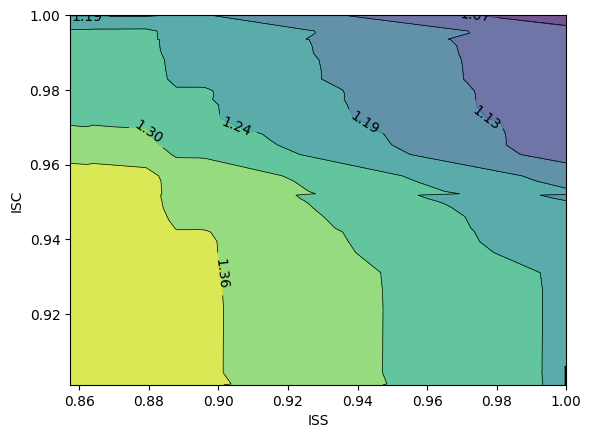

<Figure size 800x600 with 0 Axes>

In [50]:
# Filter the data
X_train_filtered = putting_X_train[putting_X_train['ISS'] >0.85]
X_train_filtered = X_train_filtered[X_train_filtered['ISC'] >0.9]

X_train_filtered = X_train_filtered[X_train_filtered['ISS'].between(0.84,1)]
X_train_filtered = X_train_filtered[X_train_filtered['ISC'].between(0.9,1)]

# Plot both features together
f_names = [('ISS', 'ISC')]
disp = PartialDependenceDisplay.from_estimator(stack_model_putting, X_train_filtered[:1838], f_names)
plt.figure(figsize=(8, 6))

**Residuals**

In [26]:
final_pipe_results = pd.DataFrame()

final_pipe_results['predicted_distance'] = predicted_distance

final_pipe_results['actual_distance'] = actual_distance

final_pipe_results['residual'] = final_pipe_results['actual_distance'] - final_pipe_results['predicted_distance']

p = figure(height=300, width=300,title="Predicted vs Actual")
p.circle(actual_distance, predicted_distance, size=5, line_color=viridis_palette[180], fill_color=viridis_palette[180], fill_alpha=0.3)
p.xaxis.axis_label = 'Actual'
p.yaxis.axis_label = 'Predicted'

z = figure(height=300, width=300,title="Predicted vs Residual")
z.circle(final_pipe_results.residual, final_pipe_results.predicted_distance, size=5, line_color=viridis_palette[180], fill_color=viridis_palette[180], fill_alpha=0.3)
z.yaxis.axis_label = 'Predicted'
z.xaxis.axis_label = 'Residual'

b = figure(width=600, height=300, toolbar_location=None,
           title="Normality of Residuals")

# Histogram
bins = np.linspace(-0.5, 0.5, 100)
hist, edges = np.histogram(final_pipe_results.residual, density=True, bins=bins)
b.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
         fill_color=viridis_palette[180], line_color="white")

b.y_range.start = 0
b.x_range.start = -0.5
b.x_range.end = 0.5

b.xaxis.axis_label = "Residuals"
b.yaxis.axis_label = "Distribution Count"

grid = gridplot([[row(p,z)], 
                 [b]])
show(grid)

**[Permutaion Importance](https://scikit-learn.org/stable/modules/generated/sklearn.inspection.permutation_importance.html)**

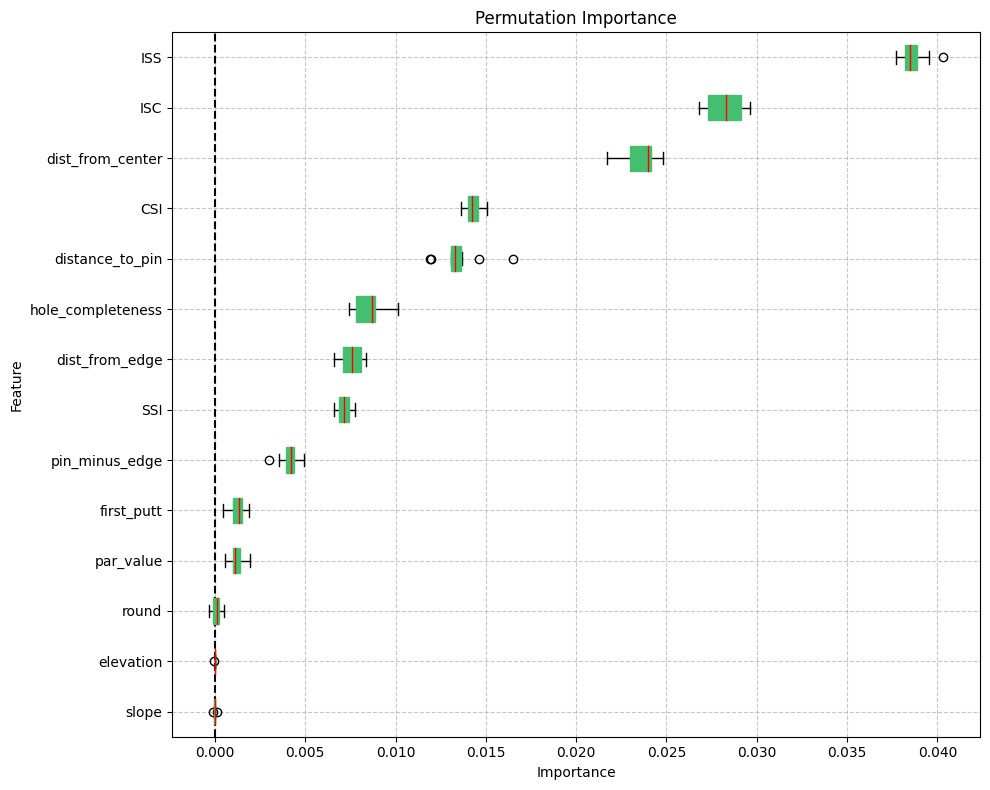

In [27]:
result = permutation_importance(stack_model_putting, 
                                putting_X_train, 
                                putting_y_train.values.ravel(), 
                                n_repeats=10,
                                random_state=42)

fig, ax = plt.subplots(figsize=(10, 8))  # Adjust size for better readability and aesthetics

perm_sorted_idx = result.importances_mean.argsort()

# Customize boxplot appearance
box = ax.boxplot(
    result.importances[perm_sorted_idx].T,
    vert=False,
    patch_artist=True,  # Enable filling colors
    boxprops=dict(facecolor=viridis_palette[180], color=viridis_palette[180]),  # Box color customization
    whiskerprops=dict(color='black'),  # Whisker color customization
    capprops=dict(color='black'),  # Cap color customization
    medianprops=dict(color='red')  # Median line color customization
)

# Set labels and title
ax.set_yticklabels(putting_X_train.columns[perm_sorted_idx])
ax.set_xlabel('Importance')
ax.set_ylabel('Feature')
ax.set_title('Permutation Importance')

# Add a grid for better readability
ax.grid(True, linestyle='--', alpha=0.7)

# Add a vertical line at x=0
ax.axvline(x=0, color="black", linestyle="--")

# Customize layout
plt.tight_layout()

plt.show()

**Add in Joblib and BZ2**

In [28]:
with bz2.BZ2File('compressed_final_putting_model.joblib.bz2', 'wb', compresslevel=9) as f:
    joblib.dump(stack_model_putting, f)